##Style Transfer using GAN

#### Introduction
Misdiagnosis in medical field is a very serious issue having adverse implications on the patient. With skilled radiologists overwhelmed by volume of work, there is critical need for Artifical Intelligence to assist them in taking the right decisions.

Magnetic Resonance Imaging (MRI) is a key imaging technology which offers superb soft tissue contrast with different contrast mechanisms such as T1 weighted and T2 weighted. A radiologist often needs multi contrast images to arrive at the right decision but is often cost prohibitive.

Using CycleGAN to translate the style of one MRI image to another, which will help in a better understanding of the scanned image. Using GANs you will create T2 weighted images from T1 weighted MRI image and vice-versa.



Problem statement:

To build a Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans.

Steps to be followed:

1. Importing Libraries
2. Data Loading and Visualization
3. Data Preprocessing
4. Model Building
5. Model Training
6. Generating a GIF

Dataset Information:

- On T1 images FAT is white
- On T2 images both FAT and WATER are white

The two basic types of MRI images are T1-weighted and T2-weighted images, often referred to as T1 and T2 images.

The timing of radiofrequency pulse sequences used to make T1 images results in images which highlight fat tissue within the body.The timing of radiofrequency pulse sequences used to make T2 images results in images which highlight fat AND water within the body.

### Importing libraries

In [ ]:
# Importing all the basic libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Importing all the required libraries
import tensorflow as tf
import glob
from skimage.transform import resize
from tensorflow.keras.utils import plot_model
import time
import imageio
import pathlib

In [ ]:
!pip install patool
import patoolib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.3/86.3 kB 2.3 MB/s eta 0:00:00


### Downloading the dataset

In [ ]:
# mounting Google drive on colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#this is executed only once in a system

# creating a new directory that serves as root
!mkdir '/content/drive/MyDrive/Style_Transfer_using_GAN'

#extracting the rar file to the folder in the drive
patoolib.extract_archive('/content/drive/MyDrive/MRI+T1_T2+Dataset.RAR', outdir='/content/drive/MyDrive/Style_Transfer_using_GAN')

mkdir: cannot create directory ‘/content/drive/MyDrive/Style_Transfer_using_GAN’: File exists


INFO patool: Extracting /content/drive/MyDrive/MRI+T1_T2+Dataset.RAR ...
INFO:patool:Extracting /content/drive/MyDrive/MRI+T1_T2+Dataset.RAR ...
INFO patool: running /usr/bin/unrar x -kb -or -- /content/drive/MyDrive/MRI+T1_T2+Dataset.RAR
INFO:patool:running /usr/bin/unrar x -kb -or -- /content/drive/MyDrive/MRI+T1_T2+Dataset.RAR
INFO patool: ... /content/drive/MyDrive/MRI+T1_T2+Dataset.RAR extracted to `/content/drive/MyDrive/Style_Transfer_using_GAN'.
INFO:patool:... /content/drive/MyDrive/MRI+T1_T2+Dataset.RAR extracted to `/content/drive/MyDrive/Style_Transfer_using_GAN'.


'/content/drive/MyDrive/Style_Transfer_using_GAN'

### Loading the dataset

In [ ]:
# setting path to the T1 an T2 datasets
T1_img = pathlib.Path('/content/drive/MyDrive/Style_Transfer_using_GAN/Tr1/TrainT1')
T2_img = pathlib.Path('/content/drive/MyDrive/Style_Transfer_using_GAN/Tr2/TrainT2')

In [ ]:
T1_images_list = os.listdir(T1_img)
print(T1_images_list[7])

T2_images_list = os.listdir(T2_img)
print(T2_images_list[7])

Image #17.png
Image #84.png


In [ ]:
# verifying the image count in the dataset
# all the data inside the dataset are in PNG format
T1_img_count = len(T1_images_list)
print('Number of images in T1 set:',T1_img_count)

T2_img_count = len(T2_images_list)
print('Number of images in T2 set:',T2_img_count)

Number of images in T1 set: 86
Number of images in T2 set: 92


In [ ]:
# Definition to read and extract t1 and t2 train images
# Returns a numpy array
def extract_images(ospath, imgfolder):
    img_list = []
    for file in imgfolder:
        img = imageio.imread(ospath / file)
        img_list.append(img)
    return np.asarray(img_list) # converts list to a numpy array

In [ ]:
# Data loading
set1 = extract_images(T1_img, T1_images_list)
set2 = extract_images(T2_img, T2_images_list)
print('T1 Shape: ',set1.shape)
print('T2 Shape: ',set2.shape)

T1 Shape:  (86, 217, 181)
T2 Shape:  (92, 217, 181)


### Data Visualization

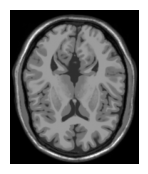

In [ ]:
# Visualizing t1 image
plt.figure(figsize=(2, 2))
plt.imshow(set1[7], cmap='gray')
plt.axis('off')
plt.show()

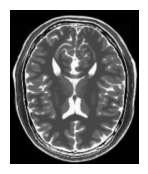

In [ ]:
# Visualizing t2 image
plt.figure(figsize=(2, 2))
plt.imshow(set2[7], cmap='gray')
plt.axis('off')
plt.show()

### Data Preprocessing

In [ ]:
# Definition to normalize image
def Normalize_img(img):
    img = (img/127.5)-1.0 # Normalize the images to [-1.0, 1.0]
    return img

In [ ]:
#Normalizing t1 and t2 images
set1 = Normalize_img(set1)
set2 = Normalize_img(set2)

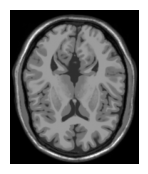

In [ ]:
#Visualizing normalized t1 image
plt.figure(figsize=(2, 2))
plt.imshow(set1[7], cmap='gray')
plt.axis('off')
plt.show()

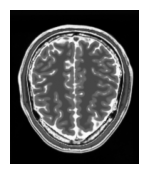

In [ ]:
#Visualizing normalized t2 image
plt.figure(figsize=(2, 2))
plt.imshow(set2[2], cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
#Resizing images to (64,64)
def Resizing_img(imgs):
    resized_img = np.zeros((imgs.shape[0], 64, 64))
    for index, img in enumerate(imgs):
        resized_img[index, :, :] = resize(img, (64, 64))
    return resized_img

In [ ]:
#Get the shapes of the images
resized_set1 = Resizing_img(set1)
resized_set2 = Resizing_img(set2)
print('T1 Shape: ',set1.shape)
print('T2 Shape: ',set2.shape)

T1 Shape:  (86, 217, 181)
T2 Shape:  (92, 217, 181)


In [ ]:
#Reshape Images to (64, 64, 1) with float pixel values
resized_set1 = resized_set1.reshape(resized_set1.shape[0], 64, 64, 1).astype('float32')
resized_set2 = resized_set2.reshape(resized_set2.shape[0], 64, 64, 1).astype('float32')

In [ ]:
#Batch and shuffle data
BATCH_SIZE = 32
resized_set1 = tf.data.Dataset.from_tensor_slices(resized_set1).shuffle(resized_set1.shape[0], seed=42).batch(BATCH_SIZE)
resized_set2 = tf.data.Dataset.from_tensor_slices(resized_set2).shuffle(resized_set2.shape[0], seed=42).batch(BATCH_SIZE)

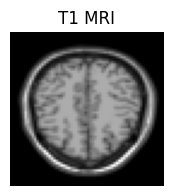

In [ ]:
#Randomly visualizing resized images from set1
data_t1 = next(iter(resized_set1))
plt.figure(figsize=(2, 2))
plt.imshow(data_t1[0].numpy()[:, :, 0], cmap='gray')
plt.title('T1 MRI')
plt.axis('off')
plt.show()

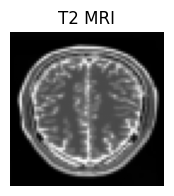

In [ ]:
#Randomly visualizing resized images from set2
data_t2 = next(iter(resized_set2))
plt.figure(figsize=(2, 2))
plt.imshow(data_t2[0].numpy()[:, :, 0], cmap='gray')
plt.title('T2 MRI')
plt.axis('off')
plt.show()

### Model Building

#### Instance Normalization

Instance Normalization are specially used with Style Transfer, where Separate Normalization is performed for each sample we perform channelwise Normalization.

In [ ]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

#### Downsample
Model convolution is applied to reduce the image size and increase image depth (encoder)


In [ ]:
# method to downsample images using convolution, downsamples the image dimensions
def downsample(filters, size, apply_norm=True):
  initializer = tf.random_normal_initializer(0., 0.02)
  # adding a sequential layer
  model = tf.keras.Sequential()
  # adding a 2D convolution layer of defined filter and size to the sequential layer
  model.add(tf.keras.layers.Conv2D(filters,
                                      size,
                                      strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))
  # batch normalization layer
  if apply_norm:
    model.add(InstanceNormalization())
  # activation layer
  model.add(tf.keras.layers.LeakyReLU())
  return model

#### Upsample
Transposed convolution is applied which increases the image size (decoder)

In [ ]:
# method to upsample the downsampled images connected to a transformer block, upsamples the image dimension
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)
  # adding a sequential layer
  model = tf.keras.Sequential()
  # adding a 2D convolution transpose layer of defined filter and size to the sequential layer
  model.add(tf.keras.layers.Conv2DTranspose(filters,
                                              size,
                                              strides=2,
                                              padding='same',
                                              kernel_initializer=initializer,
                                              use_bias=False))
  model.add(InstanceNormalization())
  if apply_dropout:
    model.add(tf.keras.layers.Dropout(0.5)) # dropout
  model.add(tf.keras.layers.ReLU()) # activation
  return model

#### Unets
Unets takes Image as an input and translate it into another Image. <p>
To do this they first use Downsampling on Input Image to learn the latent characteristics of Input Image and then use Upsampling to use this knowledge to Translate it into another Image. <p>
Let's understand it through the below image.

In [ ]:
# Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
    # the down sample generators
    down_stack = [
        downsample(64, 4, False), # (bs, 16, 16, 64)
        downsample(128, 4), # (bs, 8, 8, 128)
        downsample(128, 4), # (bs, 4, 4, 128)
        downsample(128, 4), # (bs, 2, 2, 128)
        downsample(128, 4) # (bs, 1, 1, 128)
    ]
    # the up sample generators
    up_stack = [
        upsample(128, 4, True), # (bs, 2, 2, 256)
        upsample(128, 4, True), # (bs, 4, 4, 256)
        upsample(128, 4), # (bs, 8, 8, 256)
        upsample(64, 4) # (bs, 16, 16, 128)
    ]
    #the initializer
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh')
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[64, 64, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

#### Generator

Generator follows *U-net architecture* which is fairly simple architecture; however, to create the skip connections between the encoder and decoder, we will need to concatenate some layers. So the Keras Functional API is most appropriate for this purpose.

U-Net is able to localize and distinguish borders by classifying on every pixel, with both input and output images being of same size

Here, Generator generates synthetic images(T1 to T2 and vice versa) using given random normal initializer

In [ ]:
# initializing the generator
generator_t1_t2 = unet_generator() # T1 images will transform to T2
generator_t2_t1 = unet_generator() # T2 images will transform to T1

In [ ]:
# summarizing U-net Generator
print(generator_t1_t2.summary())

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 64, 64, 1)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential (Sequential)   │ (None, 32, 32, 64)     │          1,024 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_1 (Sequential) │ (None, 16, 16, 128)    │        131,328 │ sequential[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_2 (Sequential) │ (None, 8, 8, 128)      │        262,400 │ sequential_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_3 (Sequential) │ (None, 4, 4, 128)      │        262,400 │ sequential_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_4 (Sequential) │ (None, 2, 2, 128)      │        262,400 │ sequential_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_5 (Sequential) │ (None, 4, 4, 128)      │        262,400 │ sequential_4[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 32, 32, 128)    │              0 │ sequential_5[0][0],    │
│                           │                        │                │ sequential_3[0][0],    │
│                           │                        │                │ sequential_6[0][0],    │
│                           │                        │                │ sequential_2[0][0],    │
│                           │                        │                │ sequential_7[0][0],    │
│                           │                        │                │ sequential_1[0][0],    │
│                           │                        │                │ sequential_8[0][0],    │
│                           │                        │                │ sequential[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_6 (Sequential) │ (None, 8, 8, 128)      │        524,544 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_7 (Sequential) │ (None, 16, 16, 128)    │        524,544 │ concatenate[1][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_8 (Sequential) │ (None, 32, 32, 64)     │        262,272 │ concatenate[2][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_4        │ (None, 64, 64, 1)      │          2,049 │ concatenate[3][0]      │
│ (Conv2DTranspose)         │                        │                │                        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,495,361 (9.52 MB)

 Trainable params: 2,495,361 (9.52 MB)

 Non-trainable params: 0 (0.00 B)

None


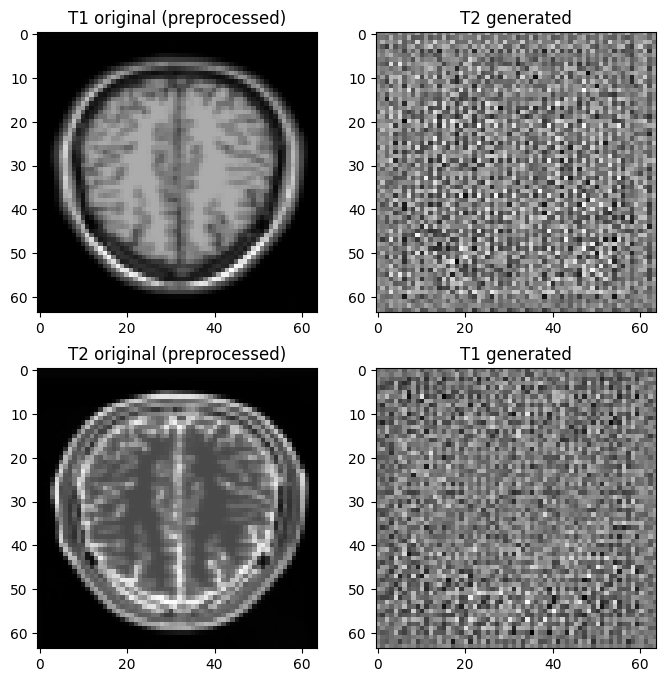

In [ ]:
# plotting the original and generated images using created Generator
to_T2 = generator_t1_t2(data_t1)
to_T1 = generator_t2_t1(data_t2)
img_array = [data_t1, to_T2, data_t2, to_T1]
img_title = ['T1 original (preprocessed)', 'T2 generated', 'T2 original (preprocessed)', 'T1 generated']

f, ax = plt.subplots(2, 2, figsize=(8,8))
ax[0,0].set_title(img_title[0])
ax[0,0].imshow(img_array[0][0].numpy()[:, :, 0], cmap='gray')
ax[0,1].set_title(img_title[1])
ax[0,1].imshow(img_array[1][0].numpy()[:, :, 0], cmap='gray')
ax[1,0].set_title(img_title[2])
ax[1,0].imshow(img_array[2][0].numpy()[:, :, 0], cmap='gray')
ax[1,1].set_title(img_title[3])
ax[1,1].imshow(img_array[3][0].numpy()[:, :, 0], cmap='gray')
plt.show()

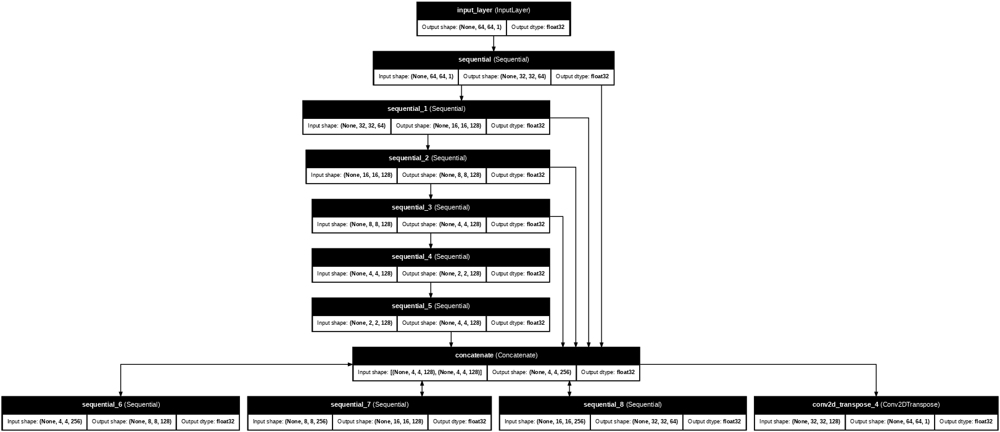

In [ ]:
# visualizing the U-net model(generator) using plot_model
# explains the transformations iccured in U-net generator
tf.keras.utils.plot_model(
    generator_t1_t2,
    to_file="unet_generator_model.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=48)

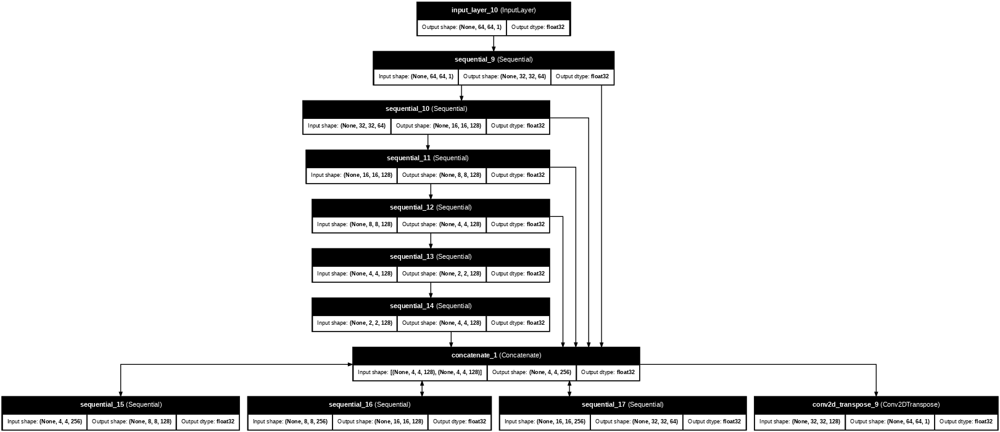

In [ ]:
# visualizing the U-net model(generator) using plot_model
# explains the transformations iccured in U-net generator
tf.keras.utils.plot_model(
    generator_t2_t1,
    to_file="unet_generator_model.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=48)

#### Discriminator
Discriminator is a traditional CNN, which we use to classify the Images. It only uses Downsampling hence. Discriminator shall classify a portion of the image generated from the generator (input image) as fake or real

In [ ]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is not used
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (64, 64, 1)
    inp = tf.keras.layers.Input(shape=[64, 64, 1], name='input_image')
    x = inp

    # add downsampling step here
    down1 = downsample(128, 4, False)(x) # (bs, 32, 32, 128)
    down2 = downsample(256, 4)(down1) # (bs, 16, 16, 256)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down2)

    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)

    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)
    return tf.keras.Model(inputs=inp, outputs=last)

In [ ]:
# Initializing the discriminators
discriminator_t1_t2 = discriminator() # separates real T1 from generated T1
discriminator_t2_t1 = discriminator() # separates real T2 from generated T2

In [ ]:
# summarizing the discriminator_t1_t2
print(discriminator_t1_t2.summary())

Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)             │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_18 (Sequential)           │ (None, 32, 32, 128)         │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_19 (Sequential)           │ (None, 16, 16, 256)         │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d (ZeroPadding2D)       │ (None, 18, 18, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 15, 15, 512)         │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ instance_normalization_17            │ (None, 15, 15, 512)         │           1,024 │
│ (InstanceNormalization)              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_12 (LeakyReLU)           │ (None, 15, 15, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_1 (ZeroPadding2D)     │ (None, 17, 17, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 14, 14, 1)           │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,633,217 (10.04 MB)

 Trainable params: 2,633,217 (10.04 MB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
# summarizing the discriminator_t2_t1
print(discriminator_t2_t1.summary())

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)             │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_20 (Sequential)           │ (None, 32, 32, 128)         │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_21 (Sequential)           │ (None, 16, 16, 256)         │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_2 (ZeroPadding2D)     │ (None, 18, 18, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 15, 15, 512)         │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ instance_normalization_19            │ (None, 15, 15, 512)         │           1,024 │
│ (InstanceNormalization)              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_15 (LeakyReLU)           │ (None, 15, 15, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_3 (ZeroPadding2D)     │ (None, 17, 17, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 14, 14, 1)           │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,633,217 (10.04 MB)

 Trainable params: 2,633,217 (10.04 MB)

 Non-trainable params: 0 (0.00 B)

None


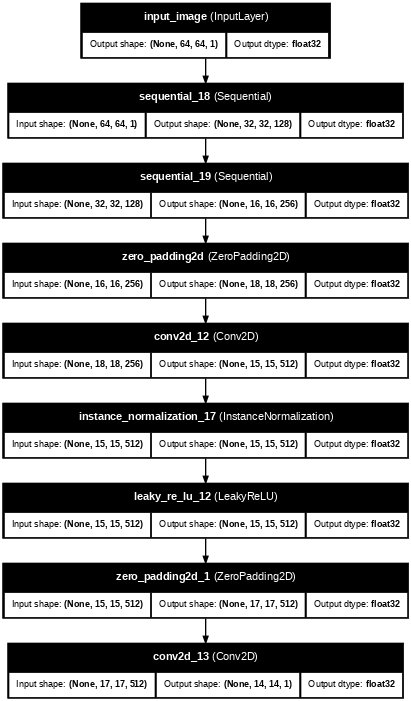

In [ ]:
# visualising the created Discriminator model using plot_model
tf.keras.utils.plot_model(
    discriminator_t1_t2,
    #to_file="discriminator_model.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=48)

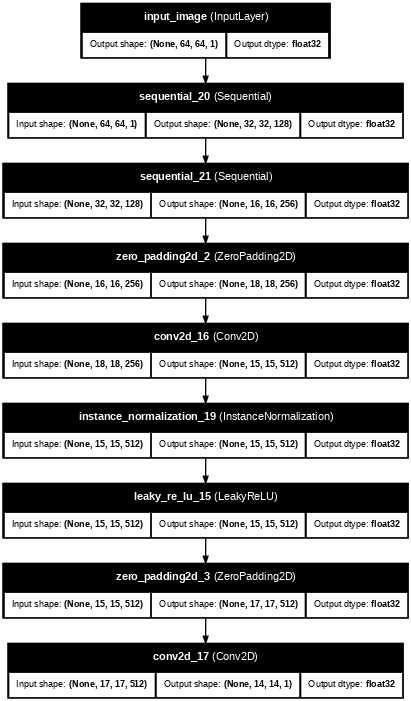

In [ ]:
# visualising the created Discriminator model using plot_model
tf.keras.utils.plot_model(
    discriminator_t2_t1,
    #to_file="discriminator_model.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=48)

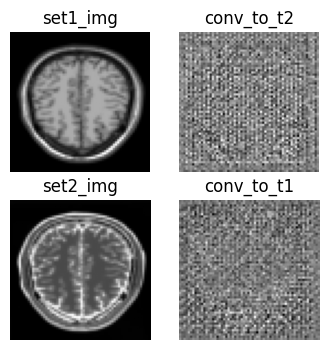

In [ ]:
# Verify output of untrained Generator models which should be a random noise
conv_to_t2 = generator_t1_t2(data_t1)
conv_to_t1 = generator_t2_t1(data_t2)
plt.figure(figsize=(4, 4))

imgs = [data_t1, conv_to_t2, data_t2, conv_to_t1]
title = ['set1_img', 'conv_to_t2', 'set2_img', 'conv_to_t1']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

#### Creating loss objects and functions

In [ ]:
# Classification loss of discriminator: BCE Loss
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# Discriminator Loss: Real Loss + Fake Loss)
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

In [ ]:
# Generator Loss: Discriminator loss on generated data
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

In [ ]:
# Cycle Loss: When we use both of Generators sequentially on a Input Image, we get Cycle Image and
# the L1 Loss between these two is called Cycle Loss.
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

In [ ]:
# Identity Loss: When we provide input image to the Generator such that no translation is needed
# because the image is already transformed, here also we take L1 Loss between Input and Output Image.
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

In [ ]:
# Leveraging Adam Optimizer to smoothen gradient descent
generator_t1_t2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_t2_t1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_t1_t2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_t2_t1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

#### Checkpoint Initialization

In [ ]:
# Initialize checkpoints to save models
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_t1_t2,
                           generator_f=generator_t2_t1,
                           discriminator_x=discriminator_t1_t2,
                           discriminator_y=discriminator_t2_t1,
                           generator_g_optimizer=generator_t1_t2_optimizer,
                           generator_f_optimizer=generator_t2_t1_optimizer,
                           discriminator_x_optimizer=discriminator_t1_t2_optimizer,
                           discriminator_y_optimizer=discriminator_t2_t1_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

In [ ]:
# Definition to show generated output whilst training
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Generated Image', 'Input Image', 'Generated Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [ ]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        fake_y = generator_t1_t2(real_x, training=True)
        cycled_x = generator_t2_t1(fake_y, training=True)

        fake_x = generator_t2_t1(real_y, training=True)
        cycled_y = generator_t1_t2(fake_x, training=True)

        # same_x and same_y are used for identity loss.
        same_x = generator_t2_t1(real_x, training=True)
        same_y = generator_t1_t2(real_y, training=True)

        disc_real_x = discriminator_t1_t2(real_x, training=True)
        disc_real_y = discriminator_t2_t1(real_y, training=True)

        disc_fake_x = discriminator_t1_t2(fake_x, training=True)
        disc_fake_y = discriminator_t2_t1(fake_y, training=True)

        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_t1_t2.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_t2_t1.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_t1_t2.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_t2_t1.trainable_variables)

    # Apply the gradients to the optimizer
    generator_t1_t2_optimizer.apply_gradients(zip(generator_g_gradients, generator_t1_t2.trainable_variables))
    generator_t2_t1_optimizer.apply_gradients(zip(generator_f_gradients, generator_t2_t1.trainable_variables))

    discriminator_t1_t2_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_t1_t2.trainable_variables))
    discriminator_t2_t1_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_t2_t1.trainable_variables))

In [ ]:
# Verify if GPU is set as the default device for training
tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))

Device mapping: no known devices.


### Model Training

In [ ]:
# Training model for 150 epochs
EPOCHS = 150

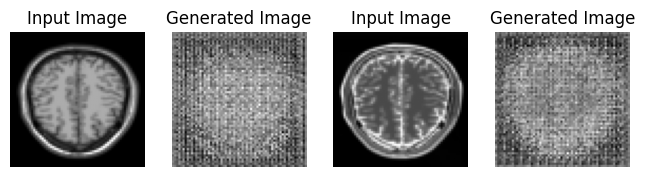

Saving checkpoint for epoch 1 at ./Trained_Model/ckpt-1


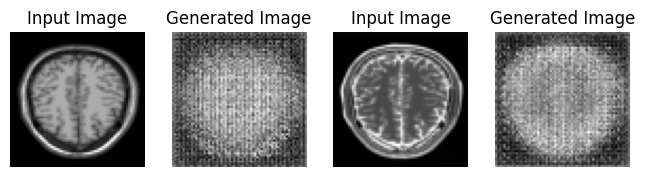

Saving checkpoint for epoch 2 at ./Trained_Model/ckpt-2


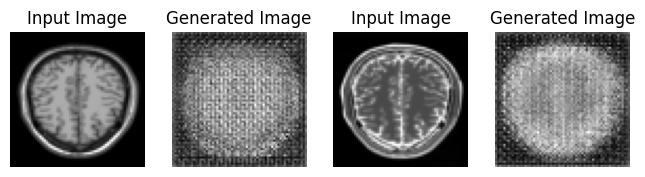

Saving checkpoint for epoch 3 at ./Trained_Model/ckpt-3


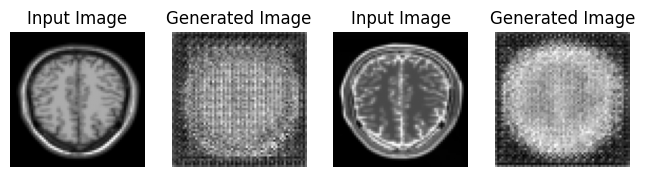

Saving checkpoint for epoch 4 at ./Trained_Model/ckpt-4


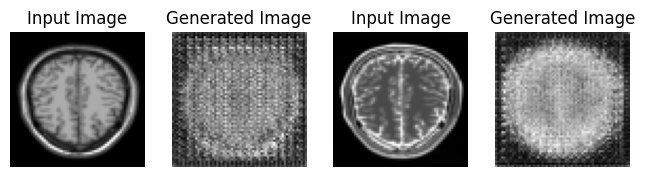

Saving checkpoint for epoch 5 at ./Trained_Model/ckpt-5


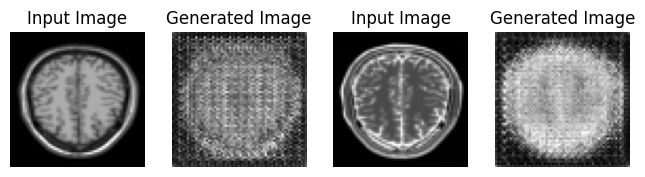

Saving checkpoint for epoch 6 at ./Trained_Model/ckpt-6


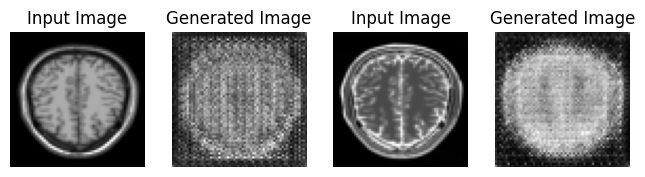

Saving checkpoint for epoch 7 at ./Trained_Model/ckpt-7


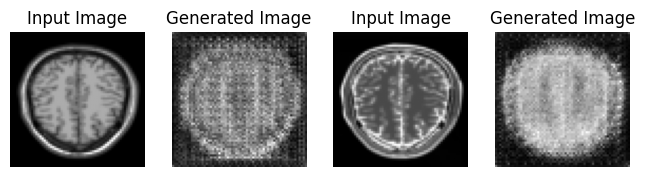

Saving checkpoint for epoch 8 at ./Trained_Model/ckpt-8


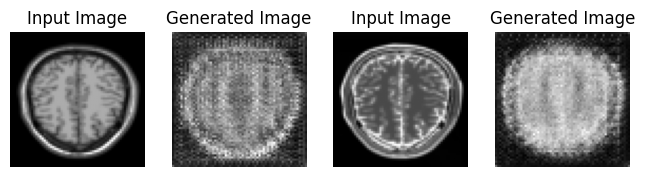

Saving checkpoint for epoch 9 at ./Trained_Model/ckpt-9


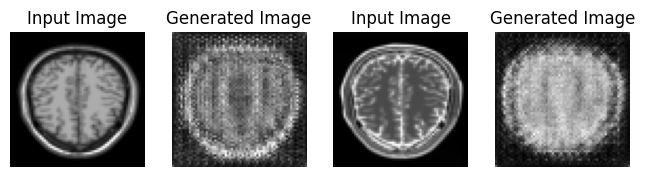

Saving checkpoint for epoch 10 at ./Trained_Model/ckpt-10


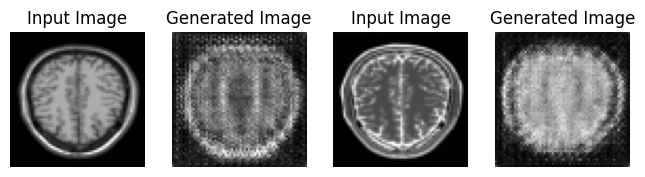

Saving checkpoint for epoch 11 at ./Trained_Model/ckpt-11


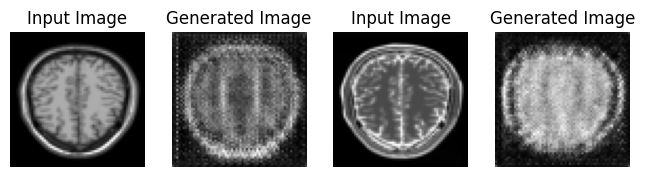

Saving checkpoint for epoch 12 at ./Trained_Model/ckpt-12


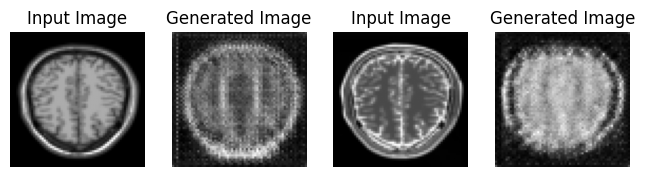

Saving checkpoint for epoch 13 at ./Trained_Model/ckpt-13


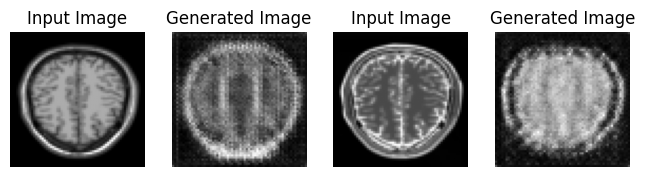

Saving checkpoint for epoch 14 at ./Trained_Model/ckpt-14


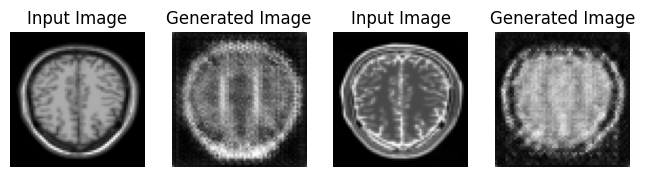

Saving checkpoint for epoch 15 at ./Trained_Model/ckpt-15


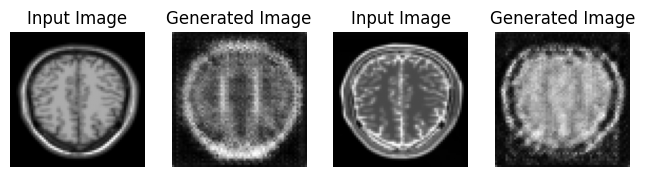

Saving checkpoint for epoch 16 at ./Trained_Model/ckpt-16


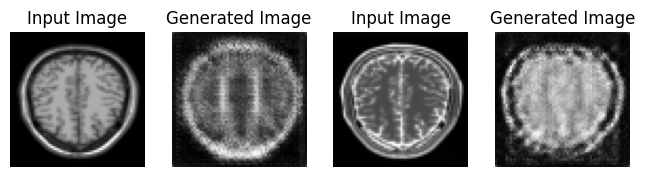

Saving checkpoint for epoch 17 at ./Trained_Model/ckpt-17


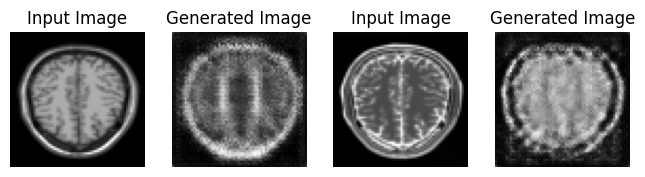

Saving checkpoint for epoch 18 at ./Trained_Model/ckpt-18


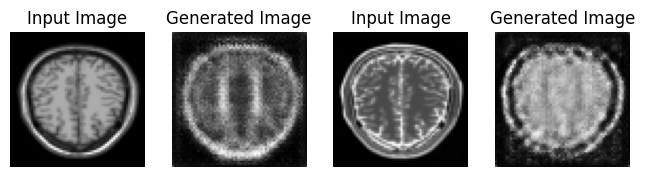

Saving checkpoint for epoch 19 at ./Trained_Model/ckpt-19


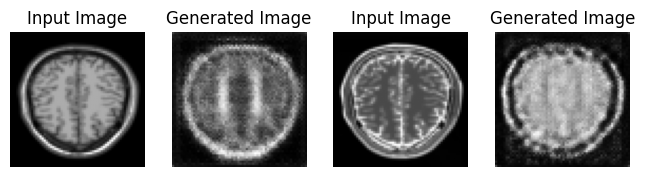

Saving checkpoint for epoch 20 at ./Trained_Model/ckpt-20


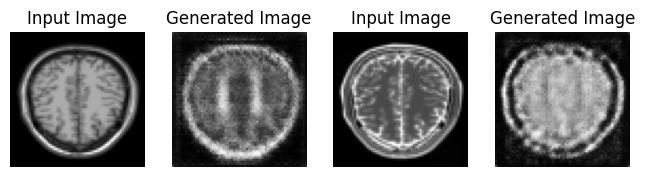

Saving checkpoint for epoch 21 at ./Trained_Model/ckpt-21


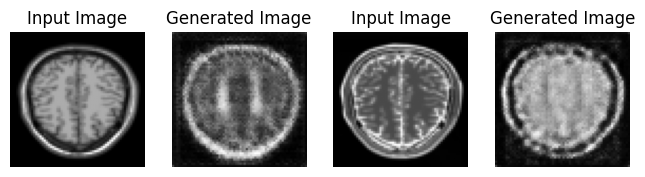

Saving checkpoint for epoch 22 at ./Trained_Model/ckpt-22


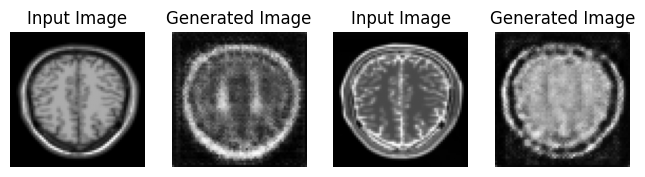

Saving checkpoint for epoch 23 at ./Trained_Model/ckpt-23


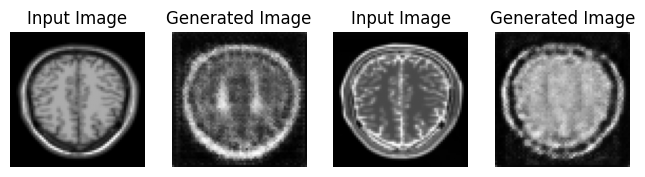

Saving checkpoint for epoch 24 at ./Trained_Model/ckpt-24


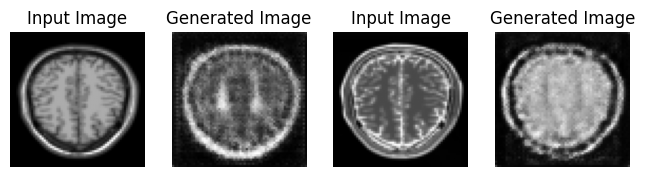

Saving checkpoint for epoch 25 at ./Trained_Model/ckpt-25


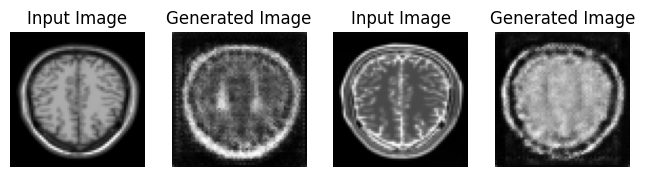

Saving checkpoint for epoch 26 at ./Trained_Model/ckpt-26


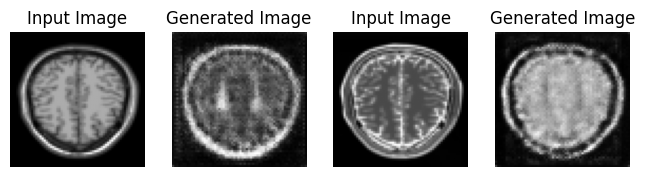

Saving checkpoint for epoch 27 at ./Trained_Model/ckpt-27


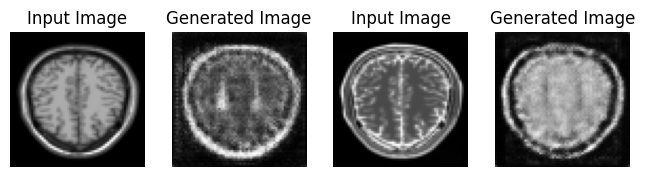

Saving checkpoint for epoch 28 at ./Trained_Model/ckpt-28


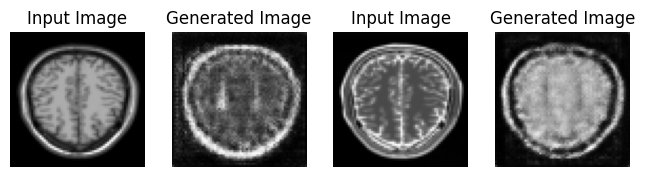

Saving checkpoint for epoch 29 at ./Trained_Model/ckpt-29


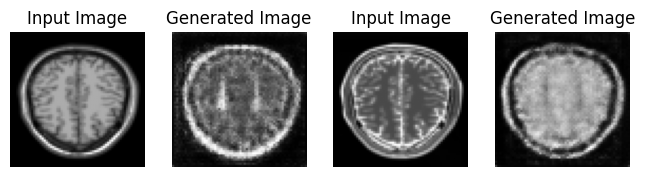

Saving checkpoint for epoch 30 at ./Trained_Model/ckpt-30


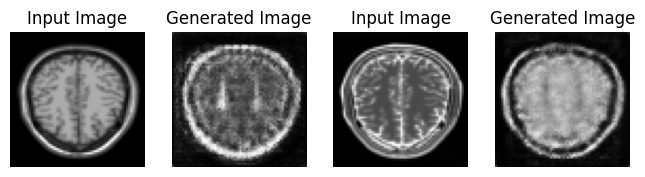

Saving checkpoint for epoch 31 at ./Trained_Model/ckpt-31


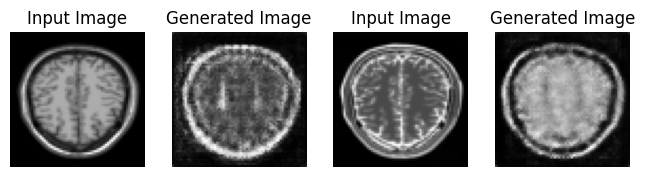

Saving checkpoint for epoch 32 at ./Trained_Model/ckpt-32


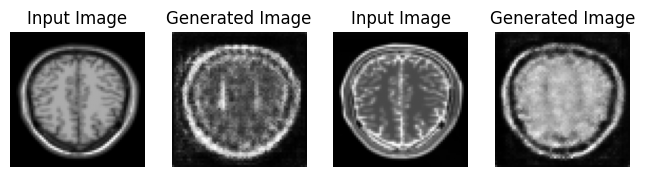

Saving checkpoint for epoch 33 at ./Trained_Model/ckpt-33


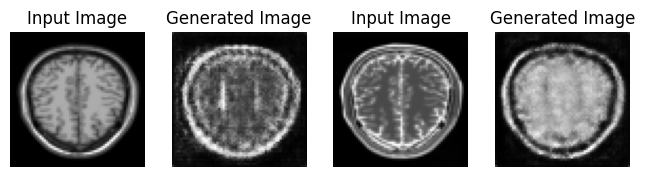

Saving checkpoint for epoch 34 at ./Trained_Model/ckpt-34


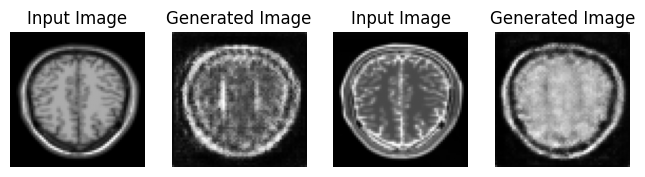

Saving checkpoint for epoch 35 at ./Trained_Model/ckpt-35


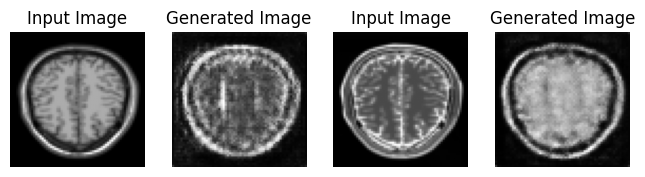

Saving checkpoint for epoch 36 at ./Trained_Model/ckpt-36


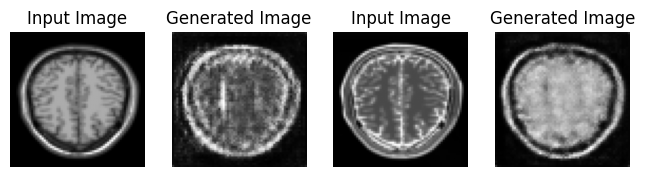

Saving checkpoint for epoch 37 at ./Trained_Model/ckpt-37


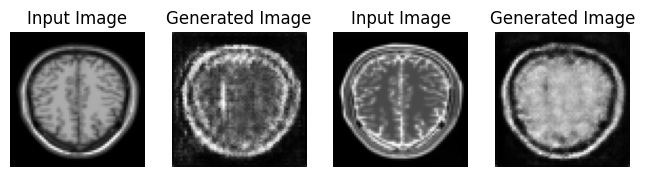

Saving checkpoint for epoch 38 at ./Trained_Model/ckpt-38


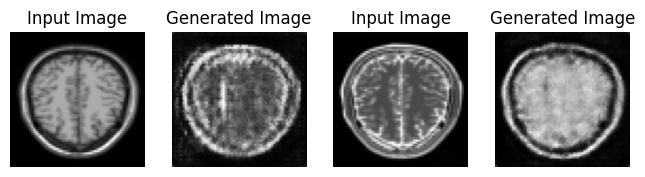

Saving checkpoint for epoch 39 at ./Trained_Model/ckpt-39


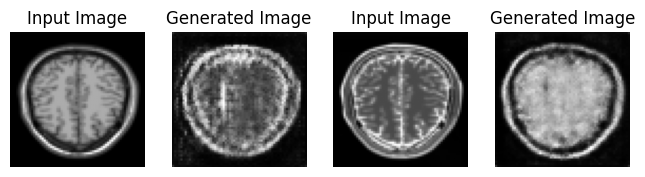

Saving checkpoint for epoch 40 at ./Trained_Model/ckpt-40


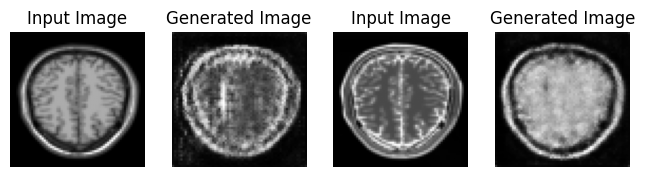

Saving checkpoint for epoch 41 at ./Trained_Model/ckpt-41


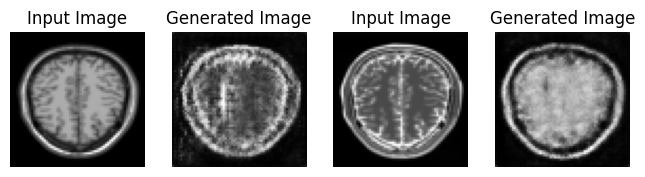

Saving checkpoint for epoch 42 at ./Trained_Model/ckpt-42


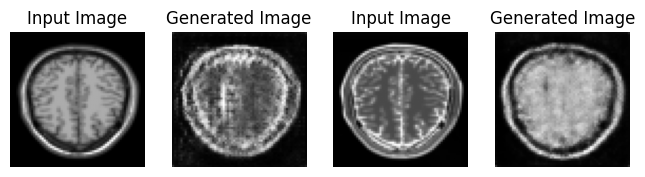

Saving checkpoint for epoch 43 at ./Trained_Model/ckpt-43


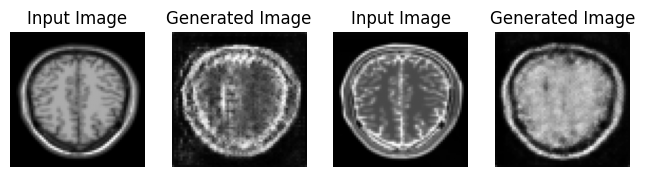

Saving checkpoint for epoch 44 at ./Trained_Model/ckpt-44


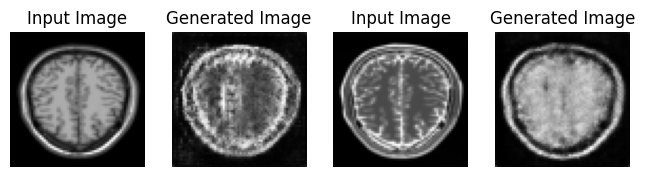

Saving checkpoint for epoch 45 at ./Trained_Model/ckpt-45


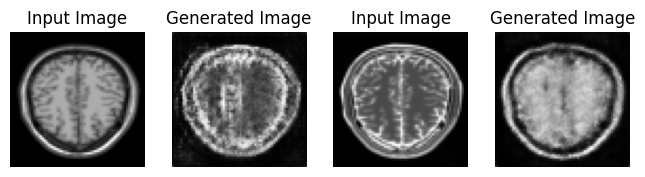

Saving checkpoint for epoch 46 at ./Trained_Model/ckpt-46


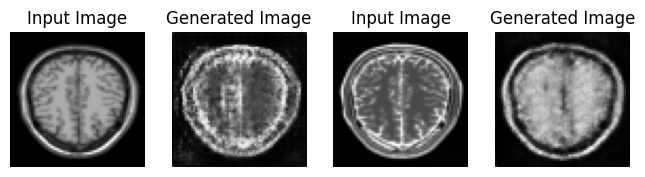

Saving checkpoint for epoch 47 at ./Trained_Model/ckpt-47


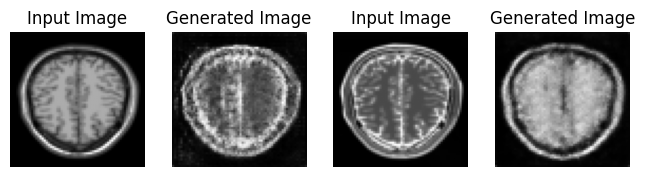

Saving checkpoint for epoch 48 at ./Trained_Model/ckpt-48


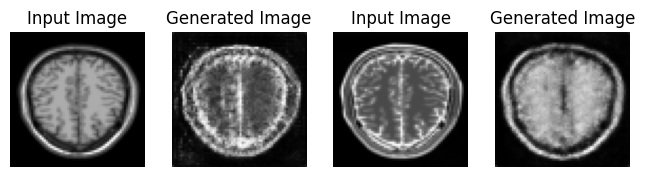

Saving checkpoint for epoch 49 at ./Trained_Model/ckpt-49


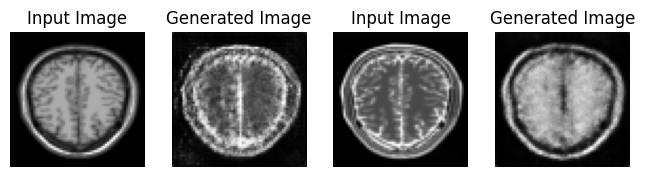

Saving checkpoint for epoch 50 at ./Trained_Model/ckpt-50


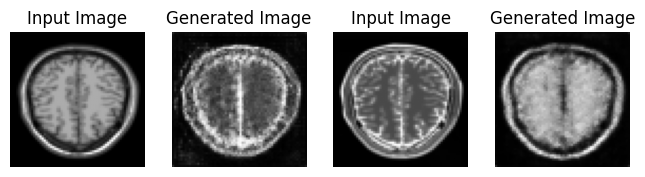

Saving checkpoint for epoch 51 at ./Trained_Model/ckpt-51


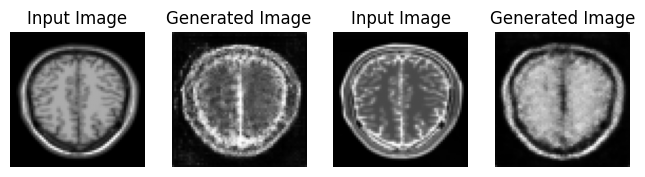

Saving checkpoint for epoch 52 at ./Trained_Model/ckpt-52


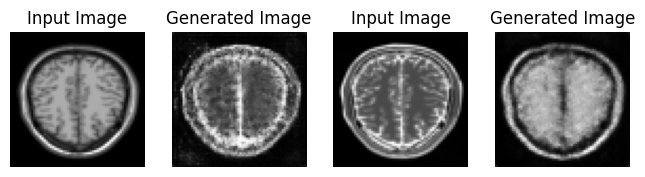

Saving checkpoint for epoch 53 at ./Trained_Model/ckpt-53


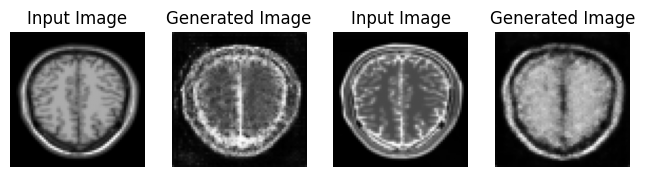

Saving checkpoint for epoch 54 at ./Trained_Model/ckpt-54


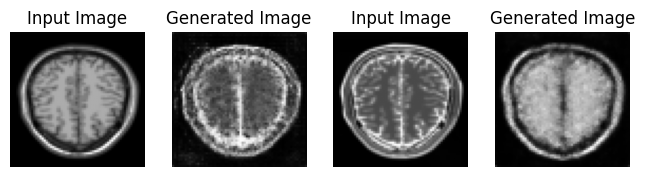

Saving checkpoint for epoch 55 at ./Trained_Model/ckpt-55


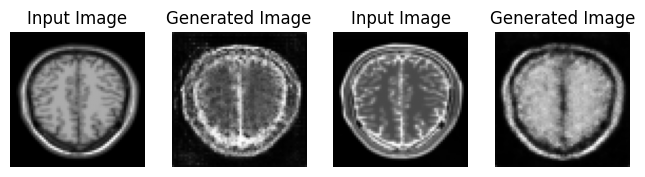

Saving checkpoint for epoch 56 at ./Trained_Model/ckpt-56


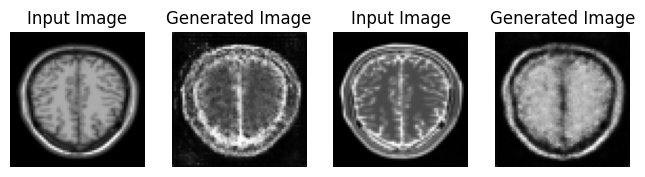

Saving checkpoint for epoch 57 at ./Trained_Model/ckpt-57


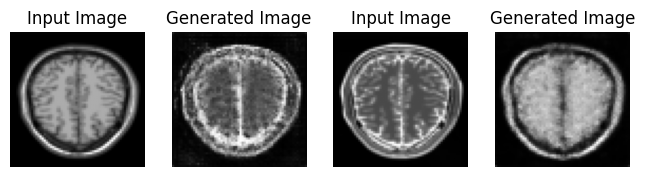

Saving checkpoint for epoch 58 at ./Trained_Model/ckpt-58


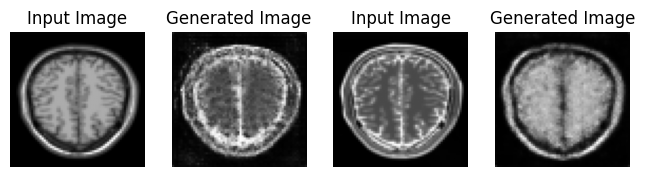

Saving checkpoint for epoch 59 at ./Trained_Model/ckpt-59


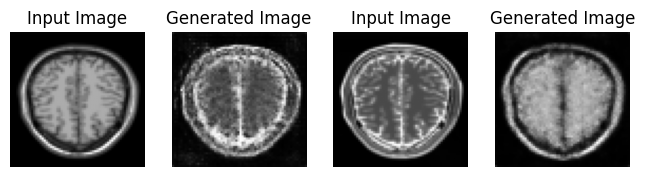

Saving checkpoint for epoch 60 at ./Trained_Model/ckpt-60


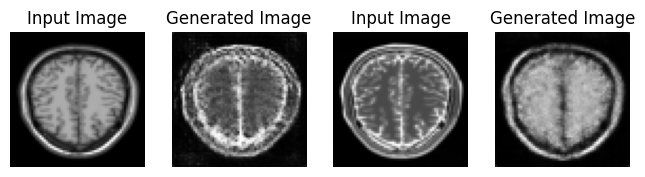

Saving checkpoint for epoch 61 at ./Trained_Model/ckpt-61


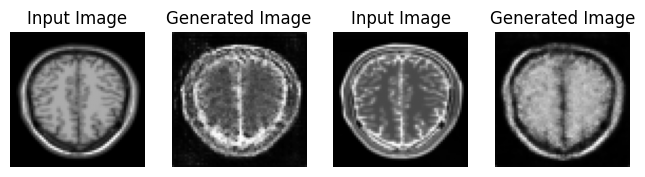

Saving checkpoint for epoch 62 at ./Trained_Model/ckpt-62


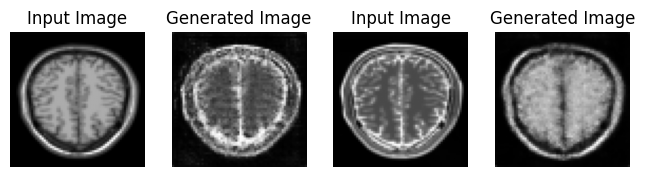

Saving checkpoint for epoch 63 at ./Trained_Model/ckpt-63


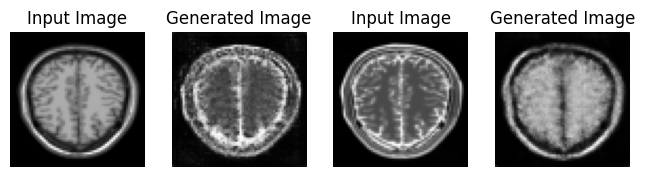

Saving checkpoint for epoch 64 at ./Trained_Model/ckpt-64


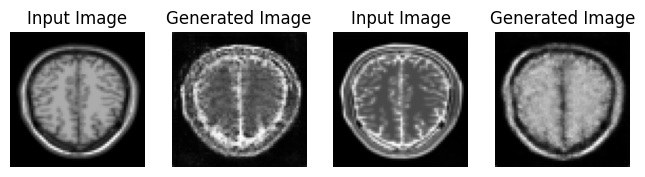

Saving checkpoint for epoch 65 at ./Trained_Model/ckpt-65


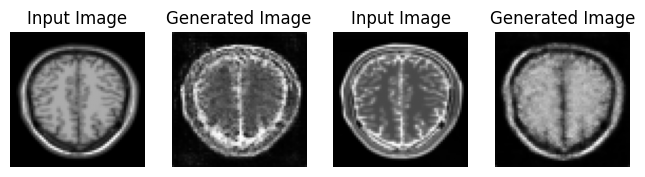

Saving checkpoint for epoch 66 at ./Trained_Model/ckpt-66


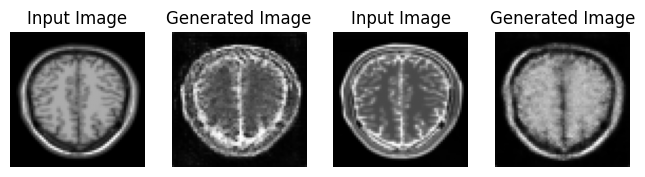

Saving checkpoint for epoch 67 at ./Trained_Model/ckpt-67


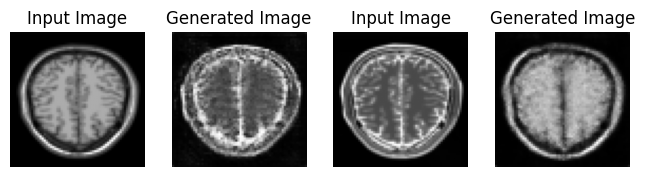

Saving checkpoint for epoch 68 at ./Trained_Model/ckpt-68


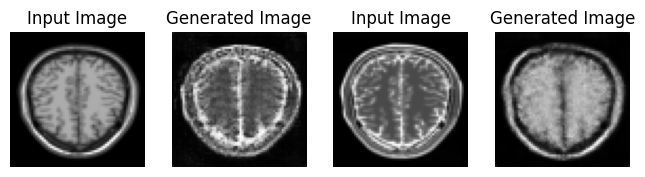

Saving checkpoint for epoch 69 at ./Trained_Model/ckpt-69


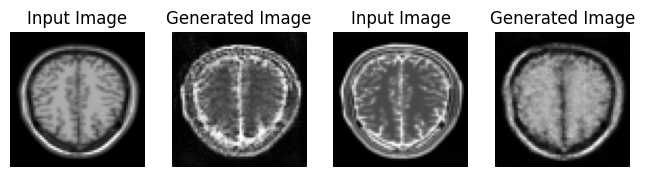

Saving checkpoint for epoch 70 at ./Trained_Model/ckpt-70


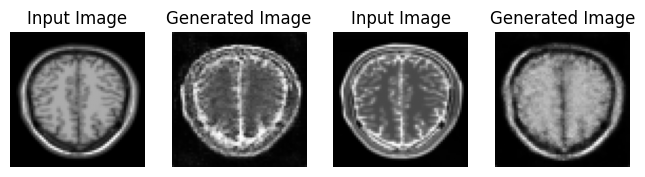

Saving checkpoint for epoch 71 at ./Trained_Model/ckpt-71


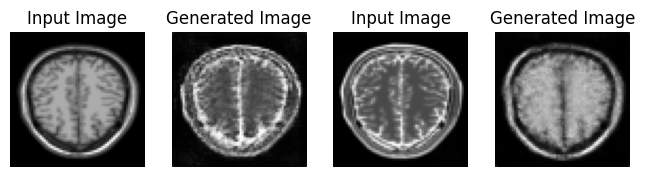

Saving checkpoint for epoch 72 at ./Trained_Model/ckpt-72


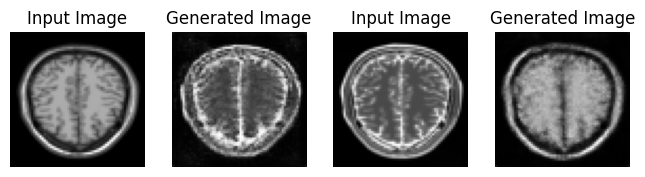

Saving checkpoint for epoch 73 at ./Trained_Model/ckpt-73


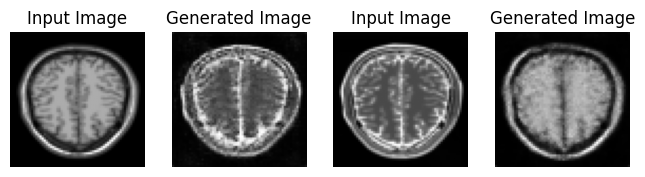

Saving checkpoint for epoch 74 at ./Trained_Model/ckpt-74


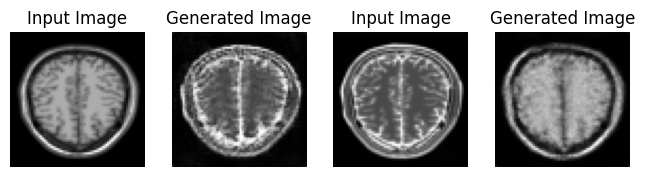

Saving checkpoint for epoch 75 at ./Trained_Model/ckpt-75


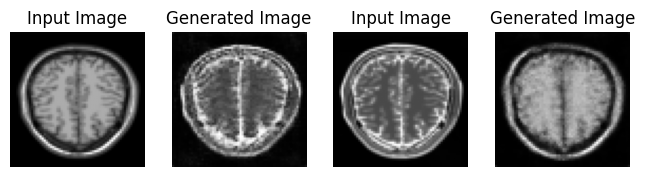

Saving checkpoint for epoch 76 at ./Trained_Model/ckpt-76


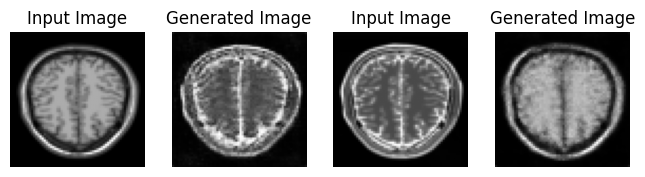

Saving checkpoint for epoch 77 at ./Trained_Model/ckpt-77


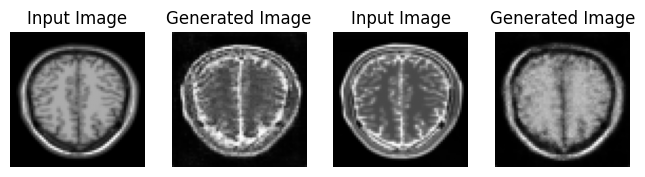

Saving checkpoint for epoch 78 at ./Trained_Model/ckpt-78


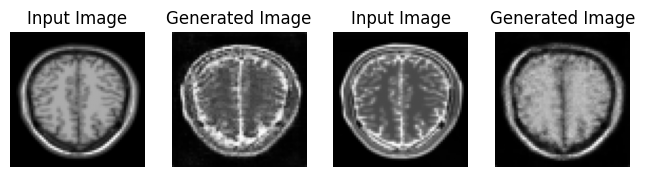

Saving checkpoint for epoch 79 at ./Trained_Model/ckpt-79


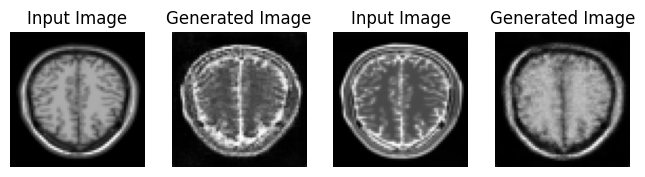

Saving checkpoint for epoch 80 at ./Trained_Model/ckpt-80


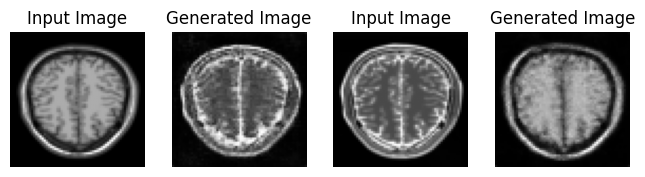

Saving checkpoint for epoch 81 at ./Trained_Model/ckpt-81


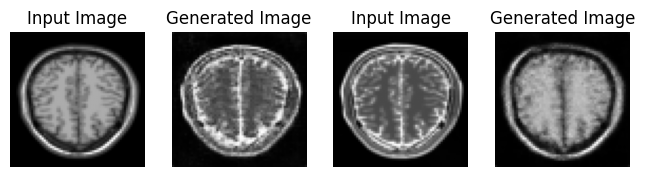

Saving checkpoint for epoch 82 at ./Trained_Model/ckpt-82


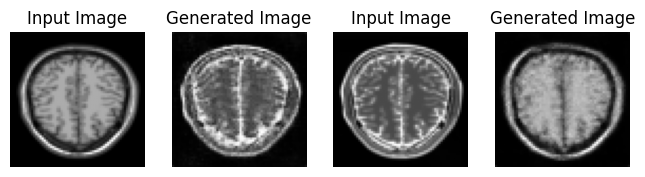

Saving checkpoint for epoch 83 at ./Trained_Model/ckpt-83


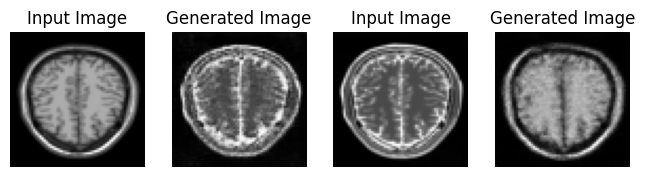

Saving checkpoint for epoch 84 at ./Trained_Model/ckpt-84


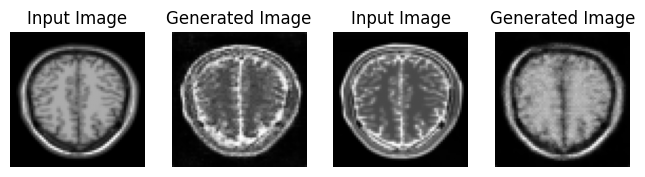

Saving checkpoint for epoch 85 at ./Trained_Model/ckpt-85


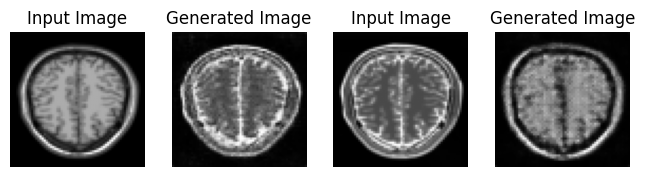

Saving checkpoint for epoch 86 at ./Trained_Model/ckpt-86


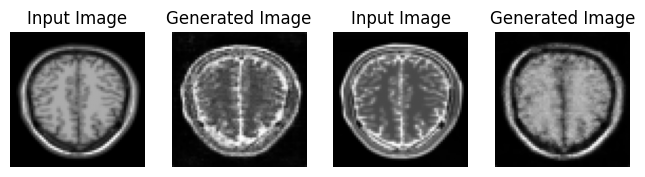

Saving checkpoint for epoch 87 at ./Trained_Model/ckpt-87


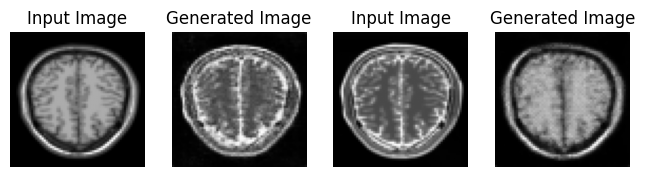

Saving checkpoint for epoch 88 at ./Trained_Model/ckpt-88


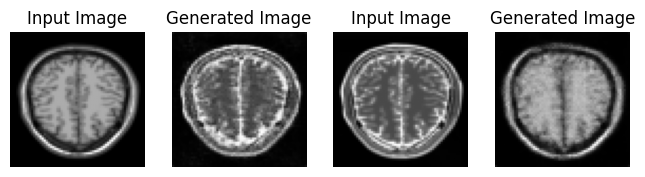

Saving checkpoint for epoch 89 at ./Trained_Model/ckpt-89


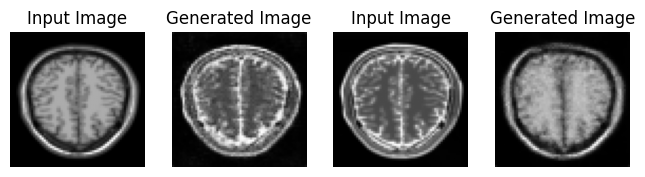

Saving checkpoint for epoch 90 at ./Trained_Model/ckpt-90


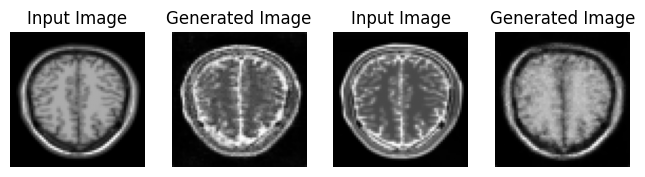

Saving checkpoint for epoch 91 at ./Trained_Model/ckpt-91


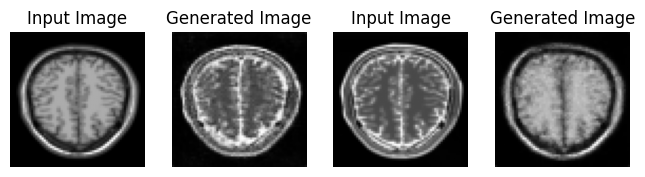

Saving checkpoint for epoch 92 at ./Trained_Model/ckpt-92


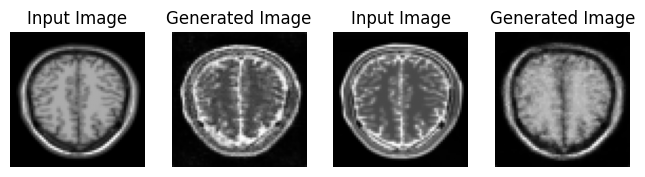

Saving checkpoint for epoch 93 at ./Trained_Model/ckpt-93


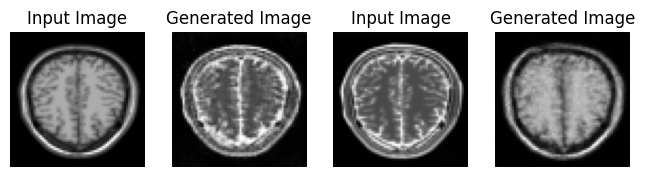

Saving checkpoint for epoch 94 at ./Trained_Model/ckpt-94


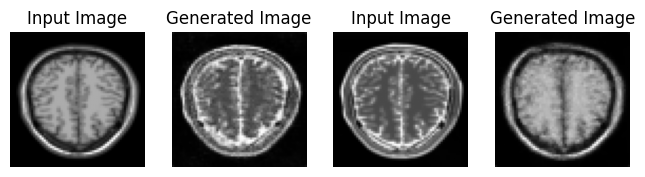

Saving checkpoint for epoch 95 at ./Trained_Model/ckpt-95


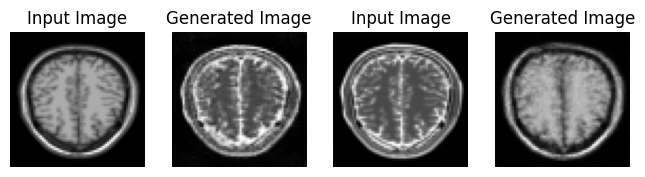

Saving checkpoint for epoch 96 at ./Trained_Model/ckpt-96


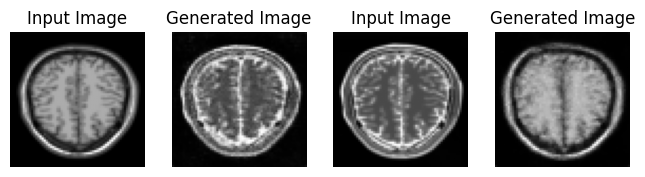

Saving checkpoint for epoch 97 at ./Trained_Model/ckpt-97


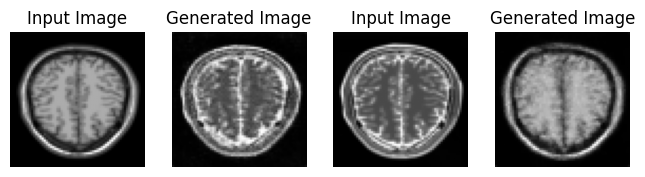

Saving checkpoint for epoch 98 at ./Trained_Model/ckpt-98


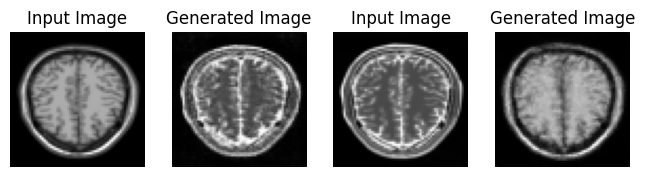

Saving checkpoint for epoch 99 at ./Trained_Model/ckpt-99


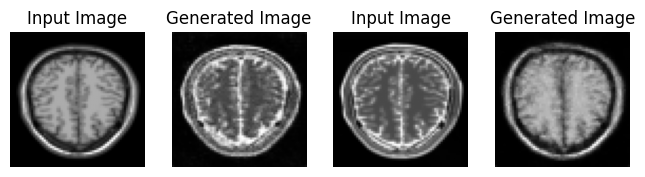

Saving checkpoint for epoch 100 at ./Trained_Model/ckpt-100


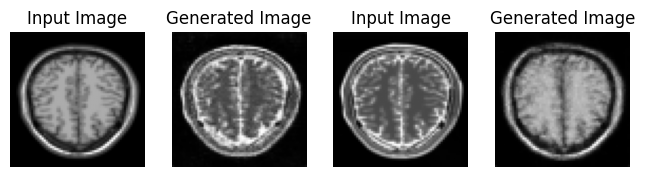

Saving checkpoint for epoch 101 at ./Trained_Model/ckpt-101


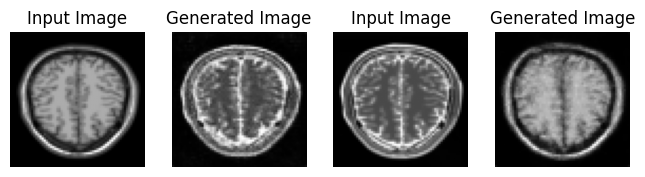

Saving checkpoint for epoch 102 at ./Trained_Model/ckpt-102


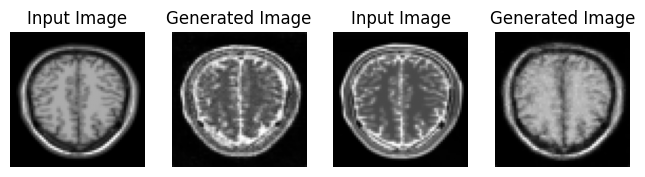

Saving checkpoint for epoch 103 at ./Trained_Model/ckpt-103


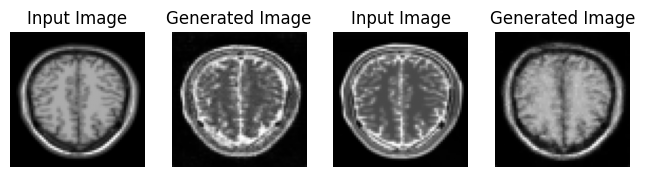

Saving checkpoint for epoch 104 at ./Trained_Model/ckpt-104


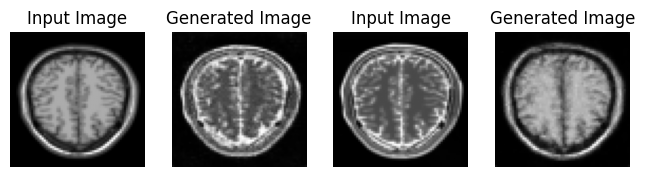

Saving checkpoint for epoch 105 at ./Trained_Model/ckpt-105


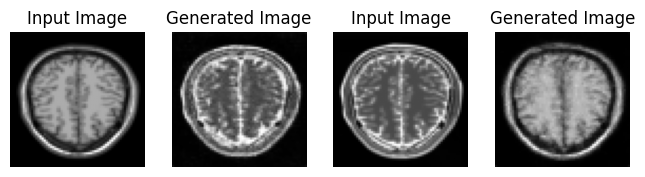

Saving checkpoint for epoch 106 at ./Trained_Model/ckpt-106


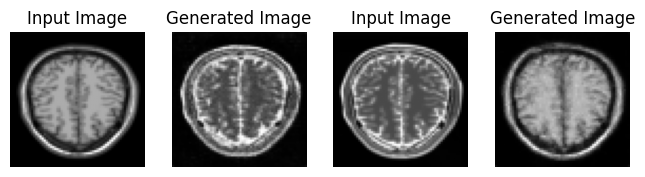

Saving checkpoint for epoch 107 at ./Trained_Model/ckpt-107


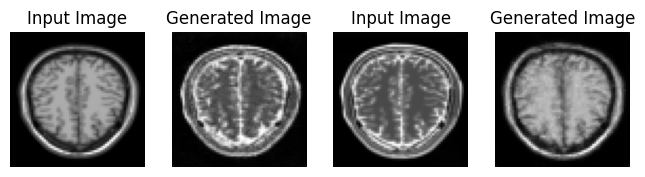

Saving checkpoint for epoch 108 at ./Trained_Model/ckpt-108


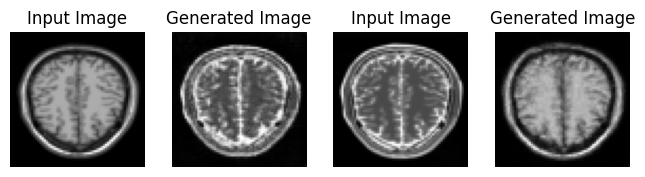

Saving checkpoint for epoch 109 at ./Trained_Model/ckpt-109


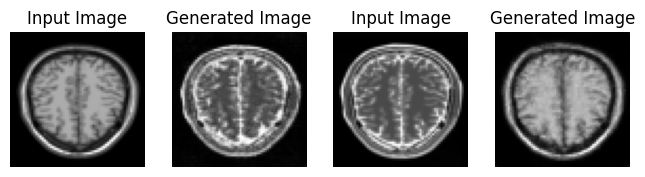

Saving checkpoint for epoch 110 at ./Trained_Model/ckpt-110


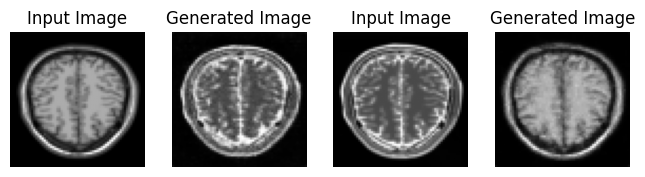

Saving checkpoint for epoch 111 at ./Trained_Model/ckpt-111


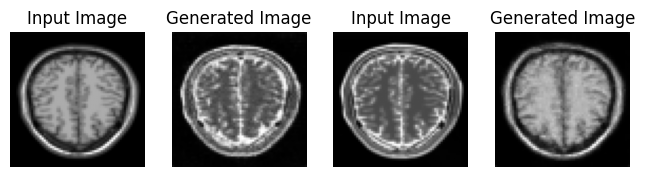

Saving checkpoint for epoch 112 at ./Trained_Model/ckpt-112


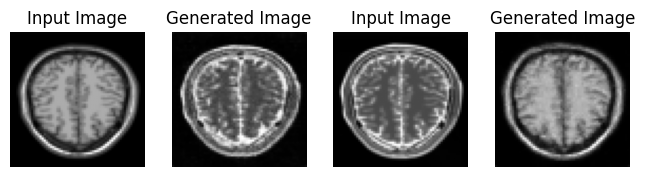

Saving checkpoint for epoch 113 at ./Trained_Model/ckpt-113


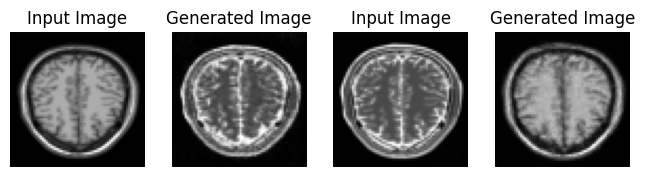

Saving checkpoint for epoch 114 at ./Trained_Model/ckpt-114


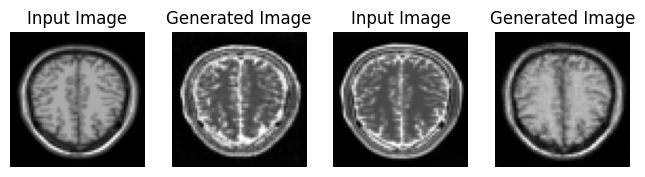

Saving checkpoint for epoch 115 at ./Trained_Model/ckpt-115


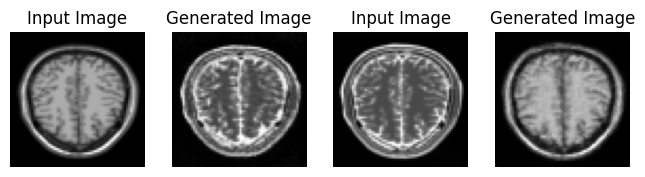

Saving checkpoint for epoch 116 at ./Trained_Model/ckpt-116


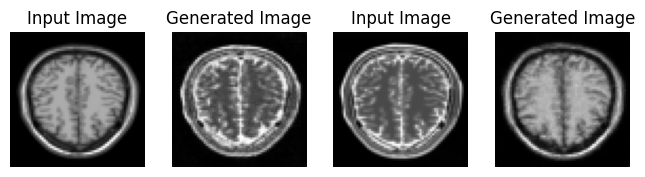

Saving checkpoint for epoch 117 at ./Trained_Model/ckpt-117


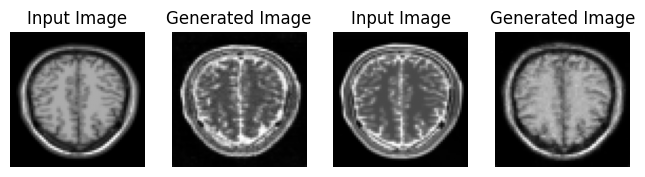

Saving checkpoint for epoch 118 at ./Trained_Model/ckpt-118


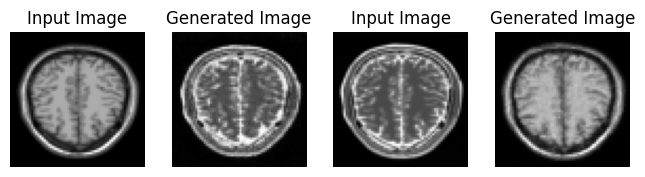

Saving checkpoint for epoch 119 at ./Trained_Model/ckpt-119


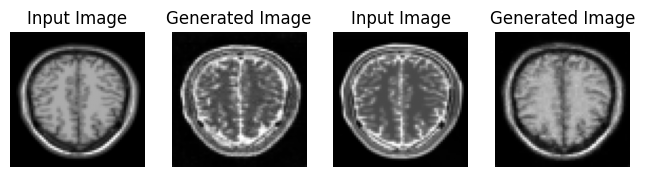

Saving checkpoint for epoch 120 at ./Trained_Model/ckpt-120


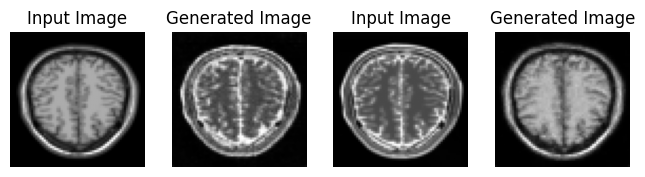

Saving checkpoint for epoch 121 at ./Trained_Model/ckpt-121


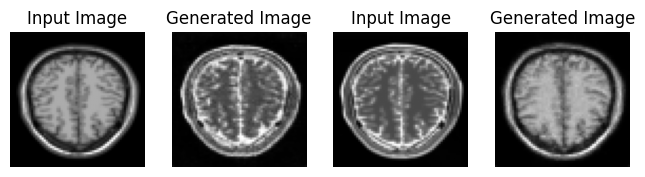

Saving checkpoint for epoch 122 at ./Trained_Model/ckpt-122


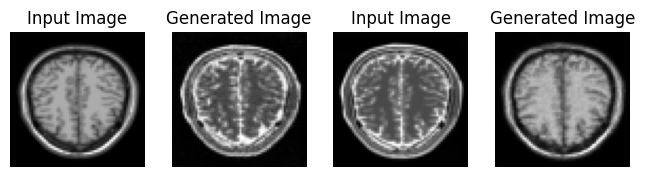

Saving checkpoint for epoch 123 at ./Trained_Model/ckpt-123


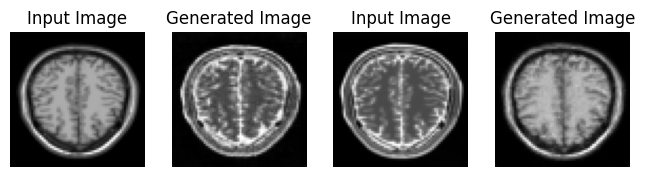

Saving checkpoint for epoch 124 at ./Trained_Model/ckpt-124


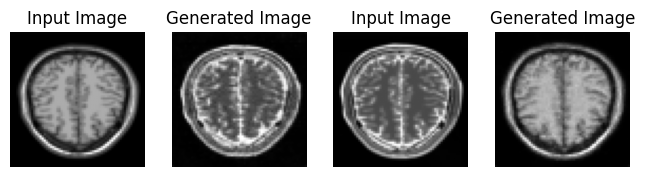

Saving checkpoint for epoch 125 at ./Trained_Model/ckpt-125


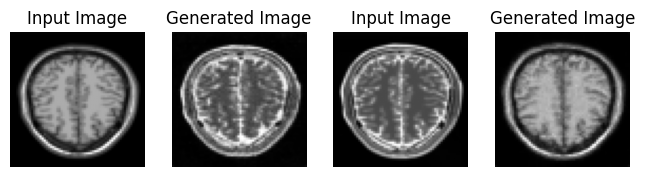

Saving checkpoint for epoch 126 at ./Trained_Model/ckpt-126


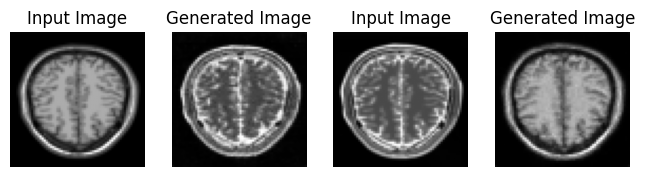

Saving checkpoint for epoch 127 at ./Trained_Model/ckpt-127


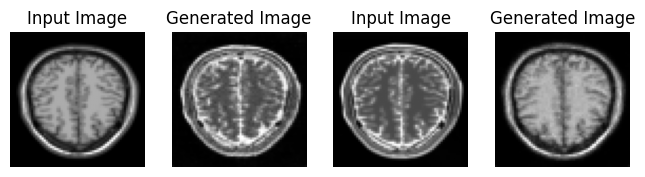

Saving checkpoint for epoch 128 at ./Trained_Model/ckpt-128


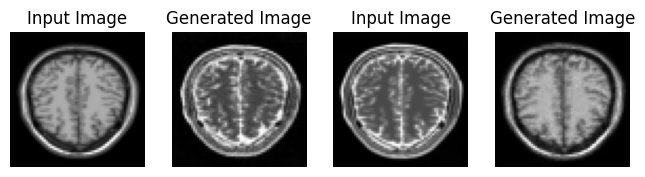

Saving checkpoint for epoch 129 at ./Trained_Model/ckpt-129


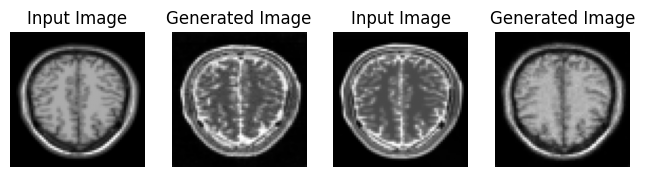

Saving checkpoint for epoch 130 at ./Trained_Model/ckpt-130


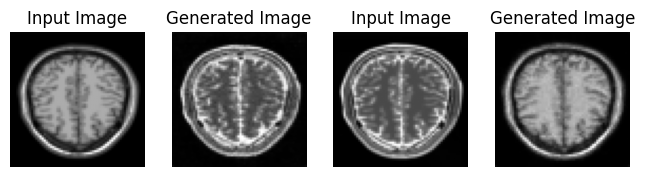

Saving checkpoint for epoch 131 at ./Trained_Model/ckpt-131


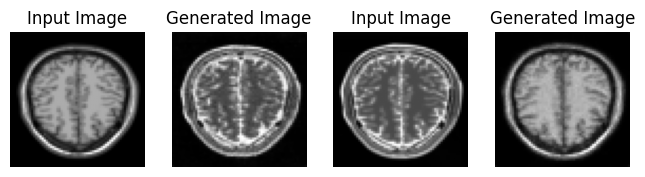

Saving checkpoint for epoch 132 at ./Trained_Model/ckpt-132


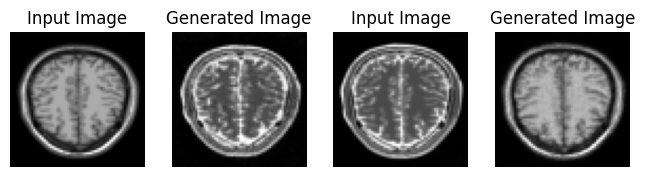

Saving checkpoint for epoch 133 at ./Trained_Model/ckpt-133


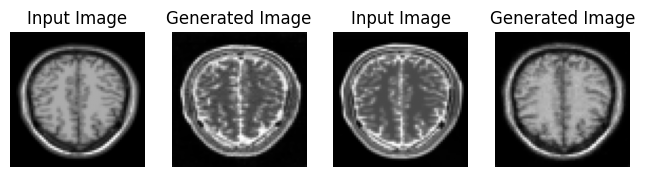

Saving checkpoint for epoch 134 at ./Trained_Model/ckpt-134


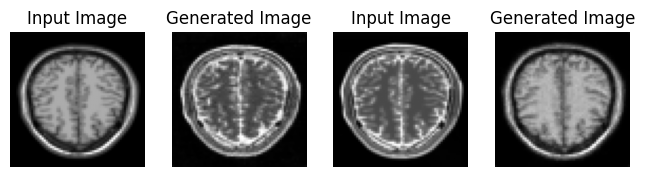

Saving checkpoint for epoch 135 at ./Trained_Model/ckpt-135


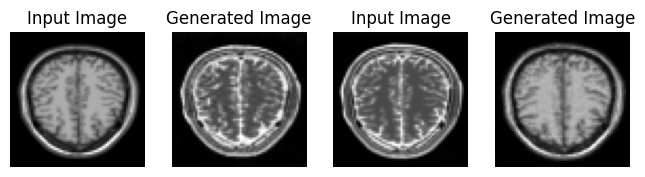

Saving checkpoint for epoch 136 at ./Trained_Model/ckpt-136


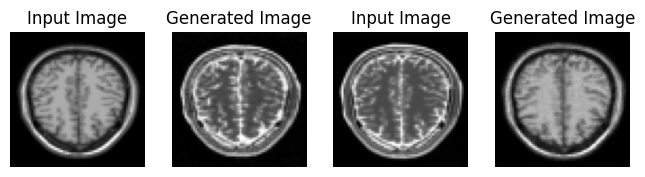

Saving checkpoint for epoch 137 at ./Trained_Model/ckpt-137


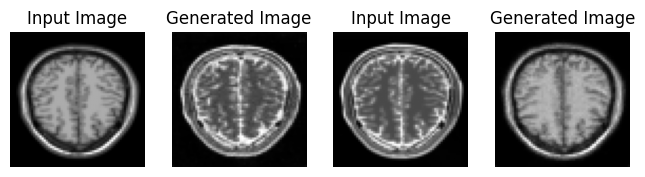

Saving checkpoint for epoch 138 at ./Trained_Model/ckpt-138


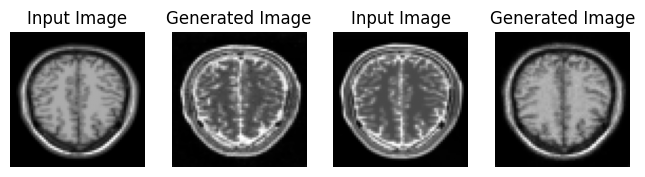

Saving checkpoint for epoch 139 at ./Trained_Model/ckpt-139


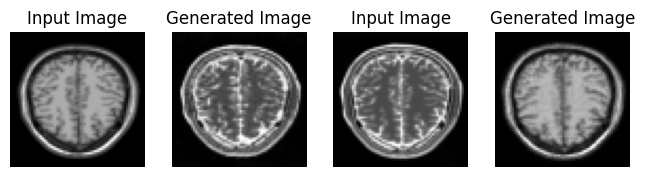

Saving checkpoint for epoch 140 at ./Trained_Model/ckpt-140


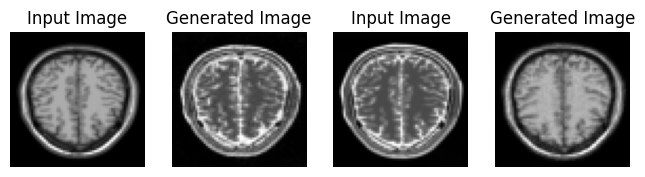

Saving checkpoint for epoch 141 at ./Trained_Model/ckpt-141


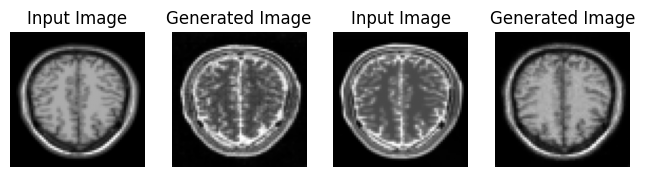

Saving checkpoint for epoch 142 at ./Trained_Model/ckpt-142


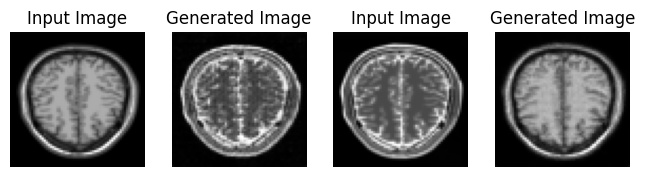

Saving checkpoint for epoch 143 at ./Trained_Model/ckpt-143


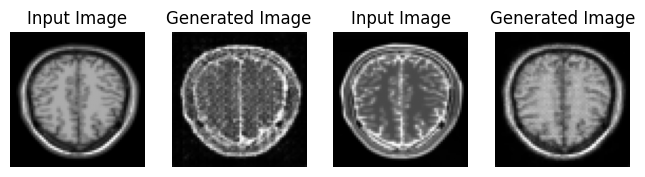

Saving checkpoint for epoch 144 at ./Trained_Model/ckpt-144


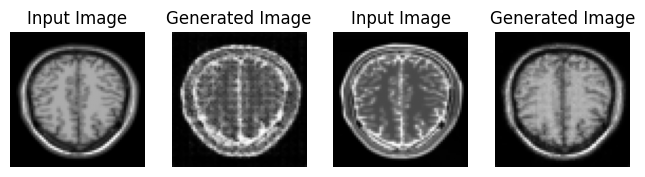

Saving checkpoint for epoch 145 at ./Trained_Model/ckpt-145


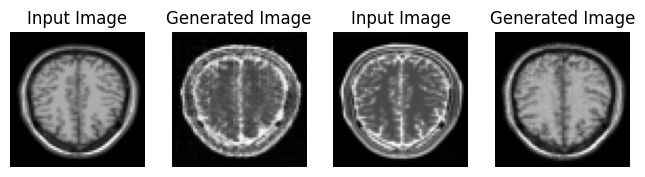

Saving checkpoint for epoch 146 at ./Trained_Model/ckpt-146


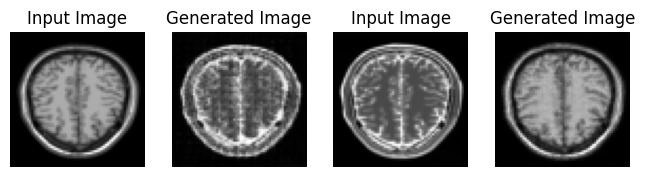

Saving checkpoint for epoch 147 at ./Trained_Model/ckpt-147


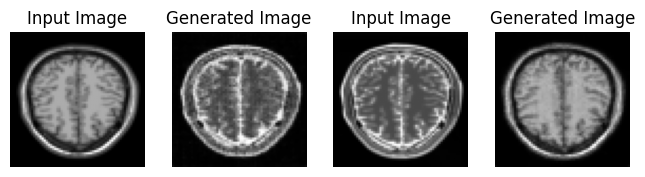

Saving checkpoint for epoch 148 at ./Trained_Model/ckpt-148


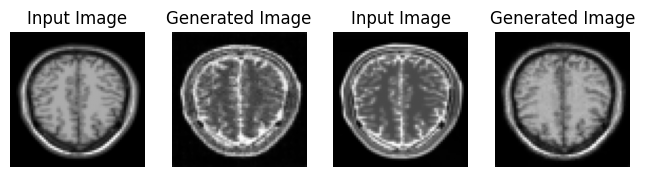

Saving checkpoint for epoch 149 at ./Trained_Model/ckpt-149


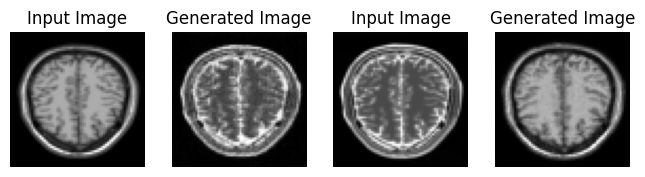

Saving checkpoint for epoch 150 at ./Trained_Model/ckpt-150
CPU times: user 4h 22min 35s, sys: 3min 35s, total: 4h 26min 11s
Wall time: 2h 41min 32s


In [ ]:
%%time
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((resized_set1, resized_set2)):
        train_step(image_x, image_y)
    # Use a sample batch for visualization
    generate_images(generator_t1_t2, data_t1, generator_t2_t1, data_t2)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

In [ ]:
#importing the module to create GIF
!pip install git+https://github.com/tensorflow/docs
import tensorflow_docs.vis.embed as embed

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-jexmgozg
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-jexmgozg
  Resolved https://github.com/tensorflow/docs to commit a81ff2e4ebf518b45cad643d88063c6f2b9e5a1e
  Preparing metadata (setup.py) ... done


In [ ]:
anim_file = 'cyclegan_mri.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


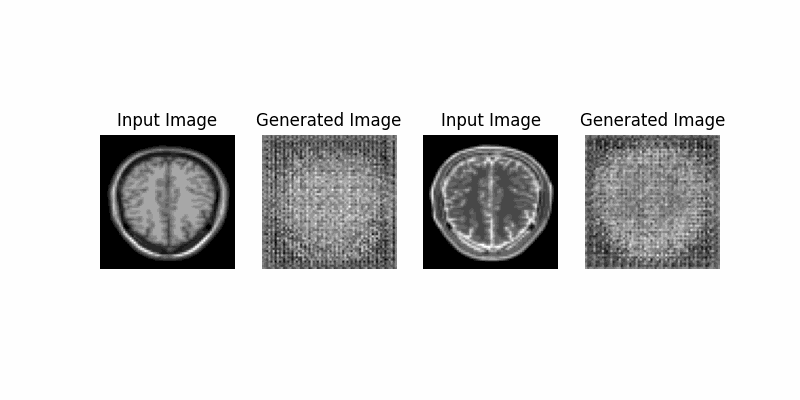

In [ ]:
embed.embed_file(anim_file)